.## Problem statement

<b>To build a Generative adversarial model(modified U-Net) which can generate artificial MRI images of different contrast levels from existing MRI scans<b>

In [49]:
!nvidia-smi

zsh:1: command not found: nvidia-smi


In [50]:
# Install all the necessary libraries
!pip install matplotlib
!pip install scikit-image
!pip install glob
!pip install keras
!pip install imageio


[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip
ERROR: Could not find a version that satisfies the requirement glob (from versions: none)

[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip
ERROR: No matching distribution found for glob

[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip


In [51]:
# Import necessary libraries
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.transform import resize
import imageio
import glob
import os

### Data Loading

In [52]:
t1_path = "Tr1/TrainT1"
t2_path = "Tr2/TrainT2"

t1_images = os.listdir(t1_path)
t2_images = os.listdir(t2_path)
# Validating filename extraction
t1_images[2]

'Image #12.png'

In [53]:
# Checking how an image looks like as a numpy array
imageio.imread(t1_path+ '/' + t1_images[2])

/tmp/ipykernel_198313/1295356521.py:2: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  imageio.imread(t1_path+ '/' + t1_images[2])


array([[0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 1],
       ...,
       [1, 1, 0, ..., 0, 0, 0],
       [1, 1, 0, ..., 0, 0, 0],
       [1, 1, 0, ..., 0, 0, 0]], dtype=uint8)

In [54]:
# Definition to read and extract t1 and t2 train images
# Returns a numpy array
def extract_images(ospath, imgfolder):
    img_list = []
    for file in imgfolder:
        img = imageio.imread(ospath+ '/' + file)
        img_list.append(img)
    return np.asarray(img_list) # converts list to a numpy array

In [55]:
# Data loading
t1 = extract_images(t1_path, t1_images)
t2 = extract_images(t2_path, t2_images)
print('T1 Shape: ',t1.shape)
print('T2 Shape: ',t2.shape)
print('Dataset size: ', t1.shape[0]+t2.shape[0])

T1 Shape:  (43, 217, 181)
T2 Shape:  (46, 217, 181)
Dataset size:  89


/tmp/ipykernel_198313/1558523928.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(ospath+ '/' + file)


It can bee seen that the number of images is very less for conventional training but an important advantage of GANs is its ability to generate images and create datasets out of it. Hence, instead of data augmentation, increasing the number of epochs should be fine. 

### Data Visualization


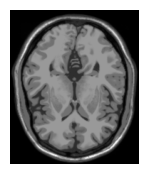

In [56]:
# Visualizing t1 image
plt.figure(figsize=(2, 2))
plt.imshow(t1[2], cmap='gray')
plt.axis('off')
plt.show()

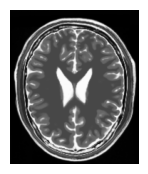

In [57]:
# VIsualizing t2 image
plt.figure(figsize=(2, 2))
plt.imshow(t2[2], cmap='gray')
plt.axis('off')
plt.show()

### Data Preprocessing

In [58]:
# Definition to normalize image
def normalize(img):
    img = (img/127.5)-1.0 # Normalize the images to [-1.0, 1.0]
    return img

In [59]:
# Normalizing t1 and t2 images
t1 = normalize(t1)
t2 = normalize(t2)

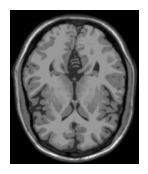

In [60]:
# Visualizing t1 image
plt.figure(figsize=(2, 2))
plt.imshow(t1[2], cmap='gray')
plt.axis('off')
plt.show()

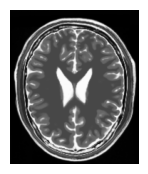

In [61]:
# Visualizing t2 image
plt.figure(figsize=(2, 2))
plt.imshow(t2[2], cmap='gray')
plt.axis('off')
plt.show()

In [62]:
# Resizing images to (64,64)
def resize_img(imgs):
    img_resized = np.zeros((imgs.shape[0], 64, 64))
    for index, img in enumerate(imgs):
        img_resized[index, :, :] = resize(img, (64, 64))
    return img_resized

In [63]:
t1_resized = resize_img(t1)
t2_resized = resize_img(t2)
print('T1 Shape: ',t1_resized.shape)
print('T2 Shape: ',t2_resized.shape)

T1 Shape:  (43, 64, 64)
T2 Shape:  (46, 64, 64)


In [64]:
# Reshape Images to (64, 64, 1) with float pixel values
t1_resized = t1_resized.reshape(t1_resized.shape[0], 64, 64, 1).astype('float32')
t2_resized = t2_resized.reshape(t2_resized.shape[0], 64, 64, 1).astype('float32')

In [65]:
# Batch and shuffle data
BATCH_SIZE = 32
t1_resized = tf.data.Dataset.from_tensor_slices(t1_resized).shuffle(t1.shape[0], seed=42).batch(BATCH_SIZE)
t2_resized = tf.data.Dataset.from_tensor_slices(t2_resized).shuffle(t2.shape[0], seed=42).batch(BATCH_SIZE)

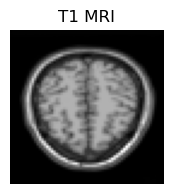

In [66]:
# Randomly visualizing resized images
t1_sample = next(iter(t1_resized))
plt.figure(figsize=(2, 2))
plt.imshow(t1_sample[0].numpy()[:, :, 0], cmap='gray')
plt.title('T1 MRI')
plt.axis('off')
plt.show()

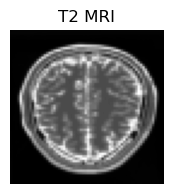

In [67]:
t2_sample = next(iter(t2_resized))
plt.figure(figsize=(2, 2))
plt.imshow(t2_sample[0].numpy()[:, :, 0], cmap='gray')
plt.title('T2 MRI')
plt.axis('off')
plt.show()

### Model Building & Training

In [68]:
# Class to implement instant normalization on images
class InstanceNormalization(tf.keras.layers.Layer):
    # Initialization of Objects
    def __init__(self, epsilon=1e-5):
        # calling parent's init
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon
    
    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)
    
    def call(self, x):
        # Compute Mean and Variance, Axes=[1,2] ensures Instance Normalization
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

In [69]:
# Downsampling method: Leads to reduction in dimensions, achieved with convolutions
def downsample(filters, size, apply_norm=True):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Conv2d layer
    result.add(tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                                      kernel_initializer=initializer, use_bias=False))
    # Add Normalization layer
    if apply_norm:
        result.add(InstanceNormalization())
    # Add Leaky Relu Activation
    result.add(tf.keras.layers.LeakyReLU())
    return result

In [70]:
# Upsampling method: Achieved with Conv2DTranspose 
def upsample(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)
    result = tf.keras.Sequential()
    # Add Transposed Conv2d layer
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                               kernel_initializer=initializer, use_bias=False))
    # Add Normalization Layer
    result.add(InstanceNormalization())
    # Conditionally add Dropout layer
    if apply_dropout:
        result.add(tf.keras.layers.Dropout(0.5))
    # Add Relu Activation Layer
    result.add(tf.keras.layers.ReLU())
    return result

In [71]:
# Unet Generator: A combination of Convolution + Transposed Convolution Layers
def unet_generator():
    down_stack = [
        downsample(128, 4, False), # (bs, 32, 32, 128)
        downsample(256, 4), # (bs, 16, 16, 256)
        downsample(256, 4), # (bs, 8, 8, 256)
        downsample(256, 4), # (bs, 4, 4, 256)
        downsample(256, 4), # (bs, 2, 2, 256)
        downsample(256, 4) # (bs, 1, 1, 256)
    ]
    up_stack = [
        upsample(256, 4, True), # (bs, 2, 2, 256)
        upsample(256, 4, True), # (bs, 4, 4, 256)
        upsample(256, 4), #(bs, 8, 8, 256)
        upsample(256, 4),# (bs, 16, 16, 256)
        upsample(128, 4) # (bs, 32, 32, 128)
    ]
    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(1, 4, strides=2, padding='same', kernel_initializer=initializer,
                                           activation='tanh') # (bs, 64, 64, 1)
    concat = tf.keras.layers.Concatenate()
    inputs = tf.keras.layers.Input(shape=[64, 64, 1])
    x = inputs
    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    
    skips = reversed(skips[:-1])
    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = concat([x, skip])
    x = last(x)
    return tf.keras.Model(inputs=inputs, outputs=x)

#### Creating generator

In [72]:
generator_g = unet_generator()
generator_f = unet_generator()

In [73]:
generator_g.summary()

Model: "functional_41"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_28      │ (None, 64, 64, 1) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_26       │ (None, 32, 32,    │      2,048 │ input_layer_28[0… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_27       │ (None, 16, 16,    │    524,800 │ sequential_26[0]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_28       │ (None, 8, 8, 256) │  1,049,088 │ sequential_27[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_29       │ (None, 4, 4, 256) │  1,049,088 │ sequential_28[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_30       │ (None, 2, 2, 256) │  1,049,088 │ sequential_29[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_31       │ (None, 1, 1, 256) │  1,049,088 │ sequential_30[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_32       │ (None, 2, 2, 256) │  1,049,088 │ sequential_31[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 32, 32,    │          0 │ sequential_32[0]… │
│ (Concatenate)       │ 256)              │            │ sequential_30[0]… │
│                     │                   │            │ sequential_33[0]… │
│                     │                   │            │ sequential_29[0]… │
│                     │                   │            │ sequential_34[0]… │
│                     │                   │            │ sequential_28[0]… │
│                     │                   │            │ sequential_35[0]… │
│                     │                   │            │ sequential_27[0]… │
│                     │                   │            │ sequential_36[0]… │
│                     │                   │            │ sequential_26[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_33       │ (None, 4, 4, 256) │  2,097,664 │ concatenate_2[0]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_34       │ (None, 8, 8, 256) │  2,097,664 │ concatenate_2[1]… │
│ (Sequential)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_35       │ (None, 16, 16,    │  2,097,664 │ concatenate_2[2]… │
│ (Sequential)        │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ sequential_36       │ (None, 32, 32,    │  1,048,832 │ concatenate_2[3]… │
│ (Sequential)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_transpose_17 │ (None, 64, 64, 1) │      4,097 │ concatenate_2[4]… │
│ (Conv2DTranspose)   │                   │            │                 

 Total params: 13,118,209 (50.04 MB)

 Trainable params: 13,118,209 (50.04 MB)

 Non-trainable params: 0 (0.00 B)

#### Creating Discriminator 

In [74]:
# Discriminators only contain Convolutional Layers and no Transposed Convolution is used 
def discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    # add input layer of size (64, 64, 1)
    inp = tf.keras.layers.Input(shape=[64, 64, 1], name='input_image')
    x = inp
    
    # add downsampling step here
    down1 = downsample(128, 4, False)(x) # (bs, 32, 32, 128)
    down2 = downsample(256, 4)(down1) # (bs, 16, 16, 128)
    # add a padding layer here
    zero_pad1 = tf.keras.layers.ZeroPadding2D()(down2) # (bs, 18, 18, 256)
    
    # implement a concrete downsampling layer here
    conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,
                                  use_bias=False)(zero_pad1) # (bs, 15, 15, 512)
    norm1 = InstanceNormalization()(conv)
    leaky_relu = tf.keras.layers.LeakyReLU()(norm1)
    
    # apply zero padding layer
    zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 17, 17, 512)
    
    # add a last pure 2D Convolution layer
    last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 14, 14, 1)
    return tf.keras.Model(inputs=inp, outputs=last)

In [75]:
discriminator_x = discriminator()
discriminator_y = discriminator()

In [76]:
discriminator_x.summary()

Model: "functional_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_image (InputLayer)        │ (None, 64, 64, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_48 (Sequential)      │ (None, 32, 32, 128)    │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_49 (Sequential)      │ (None, 16, 16, 256)    │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_4                │ (None, 18, 18, 256)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_34 (Conv2D)              │ (None, 15, 15, 512)    │     2,097,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ instance_normalization_45       │ (None, 15, 15, 512)    │         1,024 │
│ (InstanceNormalization)         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 15, 15, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ zero_padding2d_5                │ (None, 17, 17, 512)    │             0 │
│ (ZeroPadding2D)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_35 (Conv2D)              │ (None, 14, 14, 1)      │         8,193 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,633,217 (10.04 MB)

 Trainable params: 2,633,217 (10.04 MB)

 Non-trainable params: 0 (0.00 B)

### Model Training

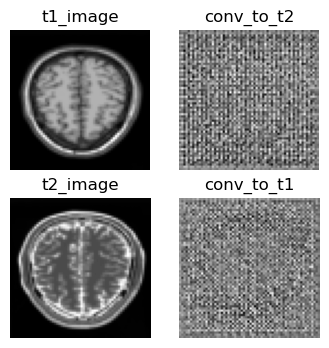

In [77]:
# Verify output of untrained Generator models which should be a random noise
conv_to_t2 = generator_g(t1_sample)
conv_to_t1 = generator_f(t2_sample)
plt.figure(figsize=(4, 4))

imgs = [t1_sample, conv_to_t2, t2_sample, conv_to_t1]
title = ['t1_image', 'conv_to_t2', 't2_image', 'conv_to_t1']

for i in range(len(imgs)):
    plt.subplot(2, 2, i+1)
    plt.title(title[i])
    plt.imshow(imgs[i][0].numpy()[:, :, 0], cmap='gray')
    plt.axis('off')
plt.show()

#### Creating loss objects and functions

In [78]:
# Classification loss of discriminator: BCE Loss
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [79]:
# Discriminator Loss: Real Loss + Fake Loss)
def discriminator_loss(real, generated):
    real_loss = loss_obj(tf.ones_like(real), real)
    generated_loss = loss_obj(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss * 0.5 # mean of losses

In [80]:
# Generator Loss: Discriminator loss on generated data
def generator_loss(generated):
    return loss_obj(tf.ones_like(generated), generated)

In [81]:
# Cycle Loss: When we use both of Generators sequentially on a Input Image, we get Cycle Image and 
# the L1 Loss between these two is called Cycle Loss.
def calc_cycle_loss(real_image, cycled_image):
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return 10.0 * loss1

In [82]:
# Identity Loss: When we provide input image to the Generator such that no translation is needed 
# because the image is already transformed, here also we take L1 Loss between Input and Output Image.
def identity_loss(real_image, same_image):
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return 0.5*loss

In [83]:
# Leveraging Adam Optimizer to smoothen gradient descent
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [84]:
# Training model for 300 epochs
EPOCHS = 100

#### Checkpoint Initialization

In [85]:
# Initialize checkpoints to save models
checkpoint_path = "./Trained_Model"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=3)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')

Latest checkpoint restored!!


In [86]:
# Definition to show generated output whilst training
def generate_images(model1, test_input1, model2, test_input2):
    prediction1 = model1(test_input1)
    prediction2 = model2(test_input2)
    plt.figure(figsize=(8, 4))
    display_list = [test_input1[0], prediction1[0], test_input2[0], prediction2[0]]
    title = ['Input Image', 'Generated Image', 'Input Image', 'Generated Image']
    for i in range(4):
        plt.subplot(1, 4, i+1)
        plt.title(title[i])
        plt.imshow(display_list[i].numpy()[:, :, 0], cmap='gray')
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

#### Defining Training Function

In [87]:
@tf.function
def train_step(real_x, real_y):
    # persistent is set to True because the tape is used more than
    # once to calculate the gradients.
    with tf.GradientTape(persistent=True) as tape:
        # Generator G translates X -> Y
        # Generator F translates Y -> X
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)
        
        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)
        
        # same_x and same_y are used for identity loss.
        same_x = generator_f(real_x, training=True)
        same_y = generator_g(real_y, training=True)
        
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)
        
        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)
        
        # calculate the loss
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)
        
        # Total generator loss = BCE loss + cycle loss + identity loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
        total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)
        
        # Discriminator's loss
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)
        
    # Calculate the gradients for generator and discriminator
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)
    
    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)
    
    # Apply the gradients to the optimizer
    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))
    
    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

In [88]:
# Verify if GPU is set as the default device for training
tf.compat.v1.Session(config=tf.compat.v1.ConfigProto(log_device_placement=True))

Device mapping: no known devices.


### Training the CycleGAN

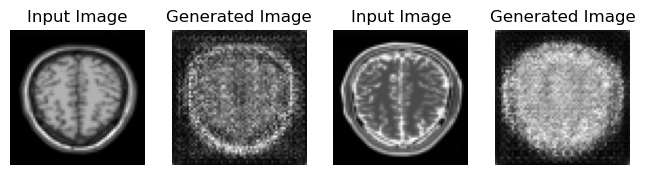

Saving checkpoint for epoch 1 at ./Trained_Model/ckpt-10


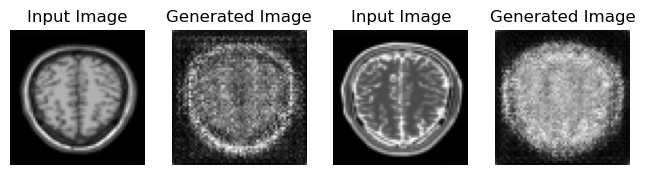

Saving checkpoint for epoch 2 at ./Trained_Model/ckpt-11


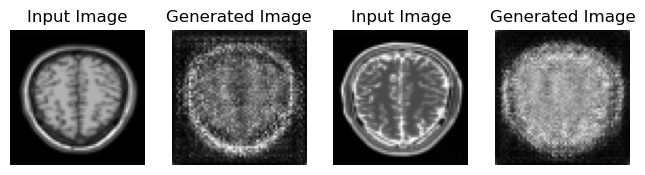

Saving checkpoint for epoch 3 at ./Trained_Model/ckpt-12


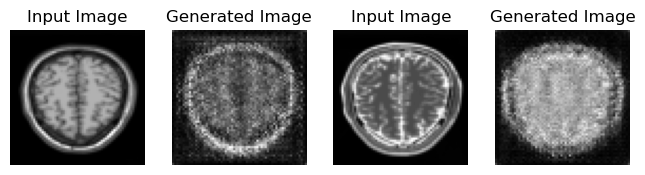

Saving checkpoint for epoch 4 at ./Trained_Model/ckpt-13


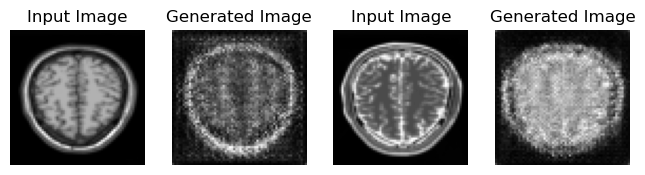

Saving checkpoint for epoch 5 at ./Trained_Model/ckpt-14


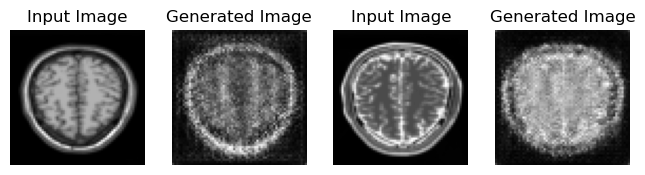

Saving checkpoint for epoch 6 at ./Trained_Model/ckpt-15


2025-04-30 20:55:38.964335: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


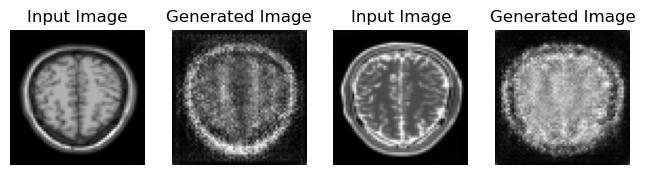

Saving checkpoint for epoch 7 at ./Trained_Model/ckpt-16


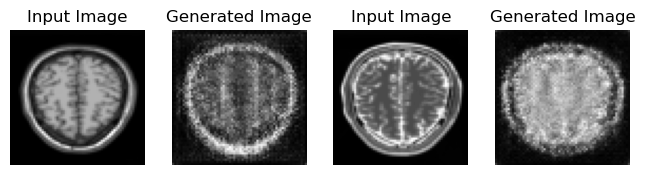

Saving checkpoint for epoch 8 at ./Trained_Model/ckpt-17


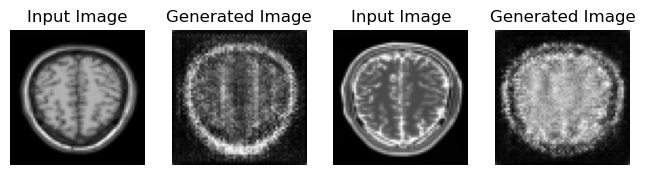

Saving checkpoint for epoch 9 at ./Trained_Model/ckpt-18


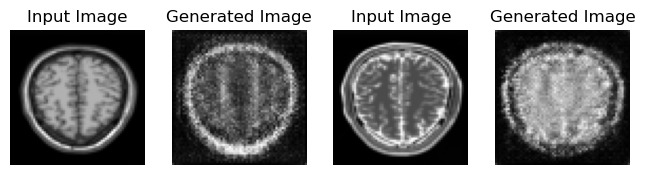

Saving checkpoint for epoch 10 at ./Trained_Model/ckpt-19


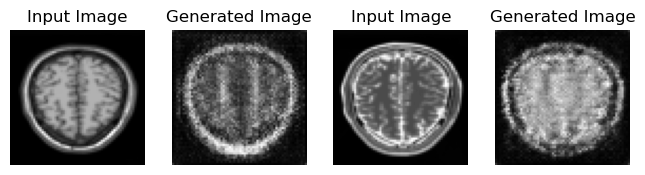

Saving checkpoint for epoch 11 at ./Trained_Model/ckpt-20


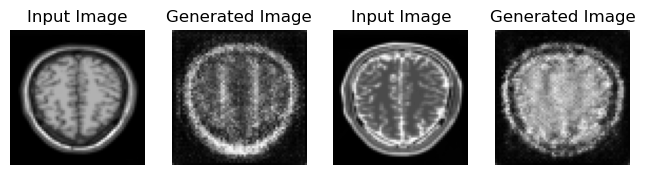

Saving checkpoint for epoch 12 at ./Trained_Model/ckpt-21


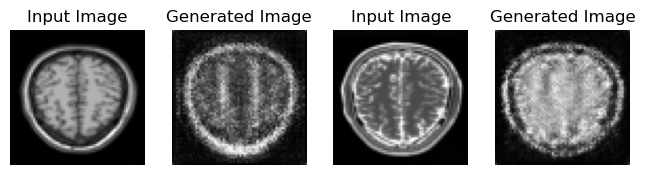

Saving checkpoint for epoch 13 at ./Trained_Model/ckpt-22


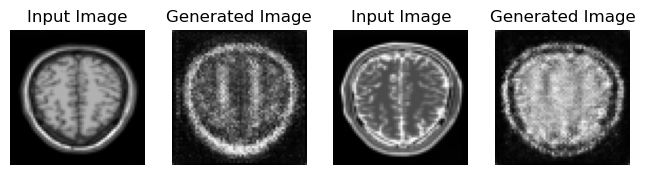

Saving checkpoint for epoch 14 at ./Trained_Model/ckpt-23


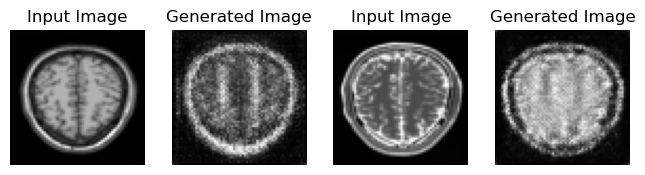

Saving checkpoint for epoch 15 at ./Trained_Model/ckpt-24


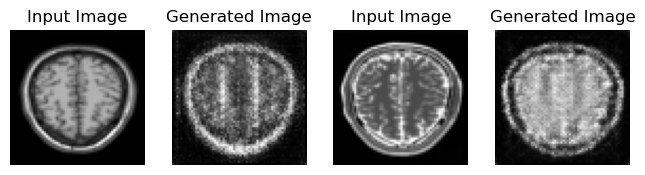

Saving checkpoint for epoch 16 at ./Trained_Model/ckpt-25


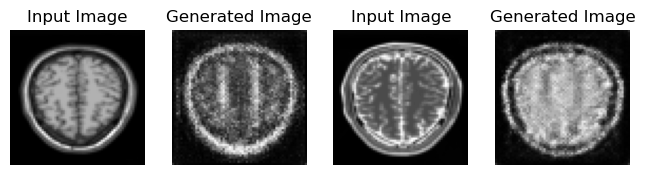

Saving checkpoint for epoch 17 at ./Trained_Model/ckpt-26


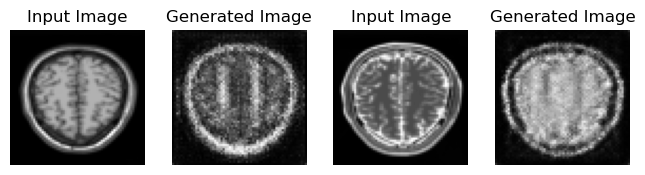

Saving checkpoint for epoch 18 at ./Trained_Model/ckpt-27


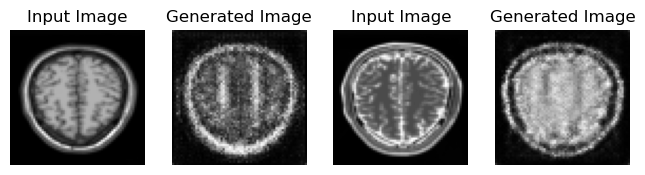

Saving checkpoint for epoch 19 at ./Trained_Model/ckpt-28


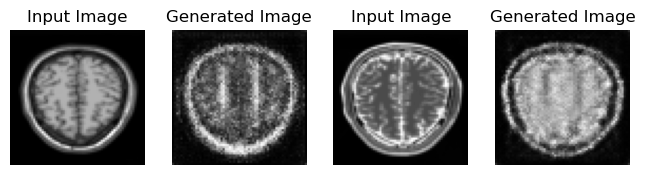

Saving checkpoint for epoch 20 at ./Trained_Model/ckpt-29


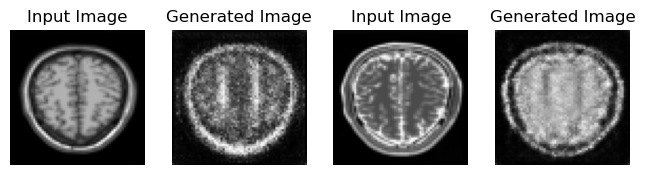

Saving checkpoint for epoch 21 at ./Trained_Model/ckpt-30


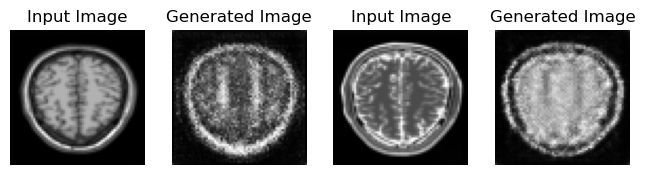

Saving checkpoint for epoch 22 at ./Trained_Model/ckpt-31


2025-04-30 20:59:21.603204: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


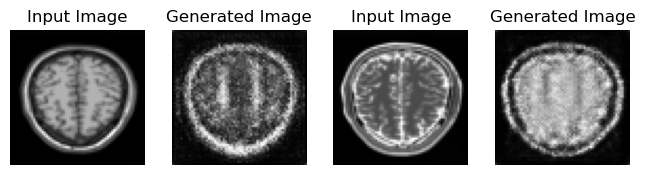

Saving checkpoint for epoch 23 at ./Trained_Model/ckpt-32


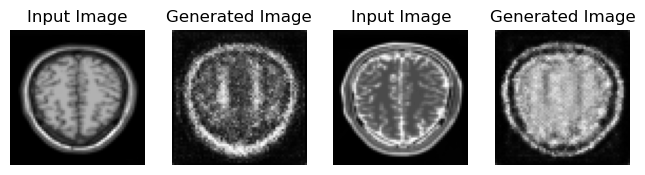

Saving checkpoint for epoch 24 at ./Trained_Model/ckpt-33


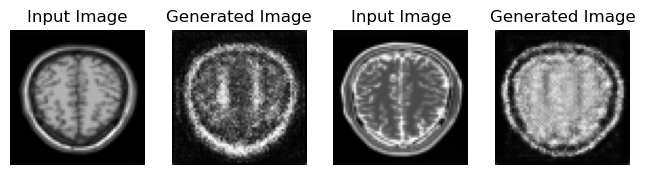

Saving checkpoint for epoch 25 at ./Trained_Model/ckpt-34


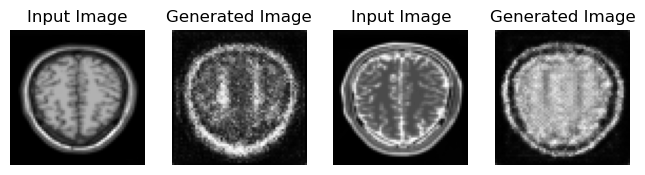

Saving checkpoint for epoch 26 at ./Trained_Model/ckpt-35


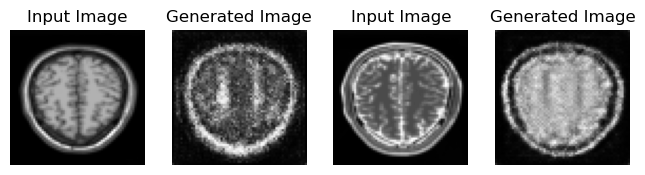

Saving checkpoint for epoch 27 at ./Trained_Model/ckpt-36


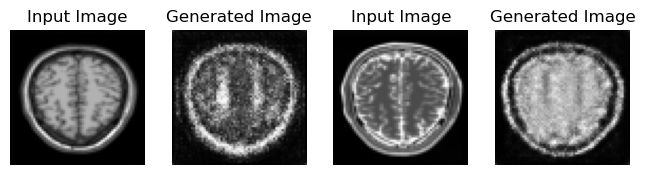

Saving checkpoint for epoch 28 at ./Trained_Model/ckpt-37


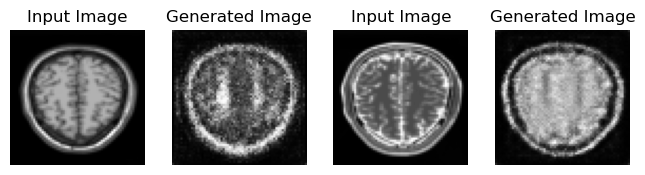

Saving checkpoint for epoch 29 at ./Trained_Model/ckpt-38


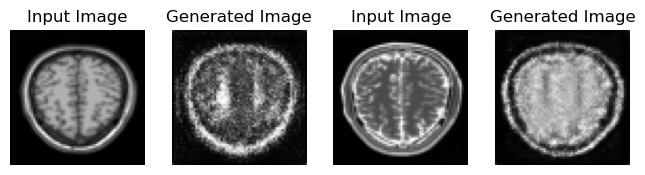

Saving checkpoint for epoch 30 at ./Trained_Model/ckpt-39


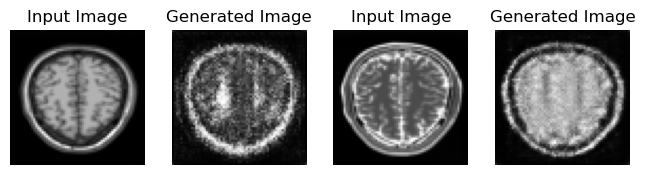

Saving checkpoint for epoch 31 at ./Trained_Model/ckpt-40


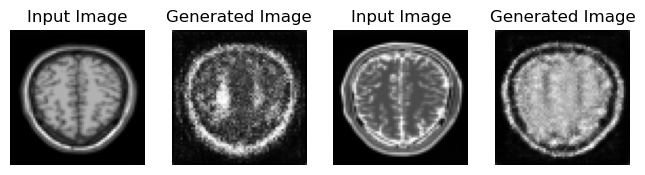

Saving checkpoint for epoch 32 at ./Trained_Model/ckpt-41


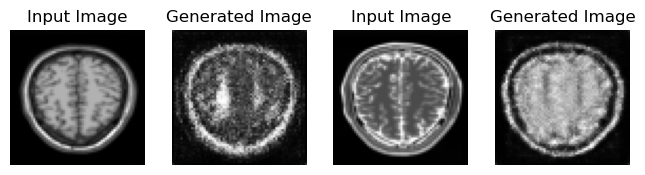

Saving checkpoint for epoch 33 at ./Trained_Model/ckpt-42


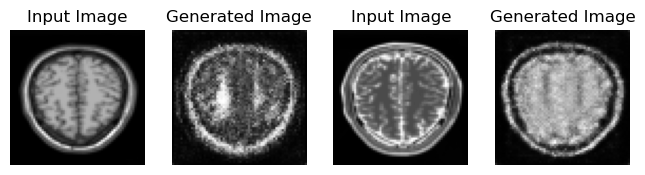

Saving checkpoint for epoch 34 at ./Trained_Model/ckpt-43


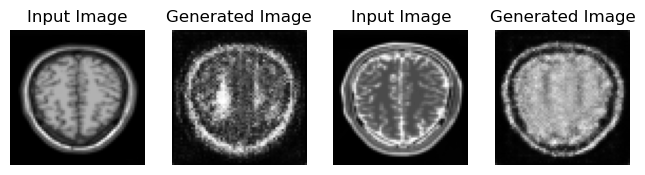

Saving checkpoint for epoch 35 at ./Trained_Model/ckpt-44


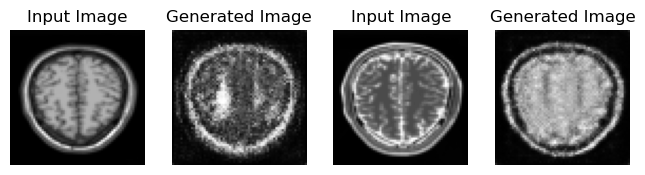

Saving checkpoint for epoch 36 at ./Trained_Model/ckpt-45


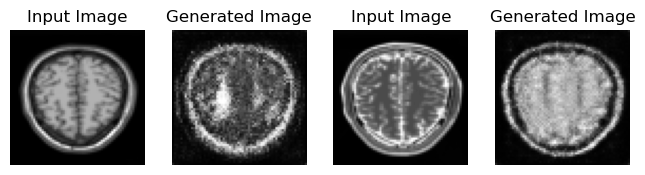

Saving checkpoint for epoch 37 at ./Trained_Model/ckpt-46


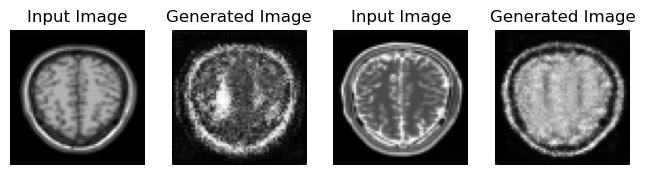

Saving checkpoint for epoch 38 at ./Trained_Model/ckpt-47


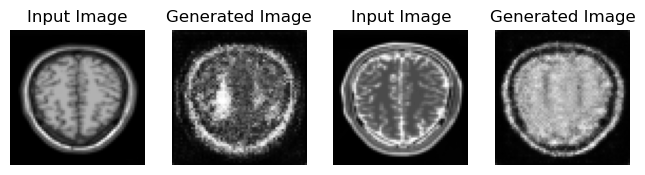

Saving checkpoint for epoch 39 at ./Trained_Model/ckpt-48


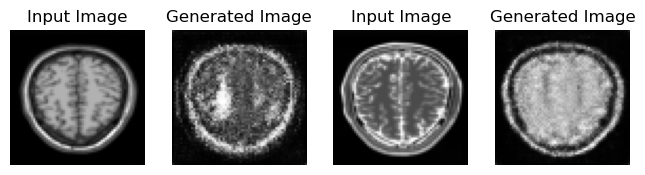

Saving checkpoint for epoch 40 at ./Trained_Model/ckpt-49


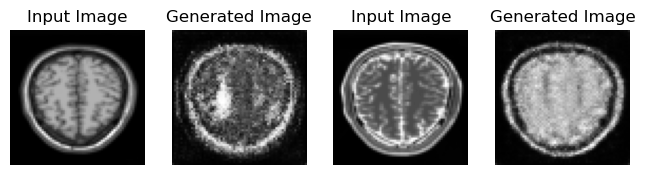

Saving checkpoint for epoch 41 at ./Trained_Model/ckpt-50


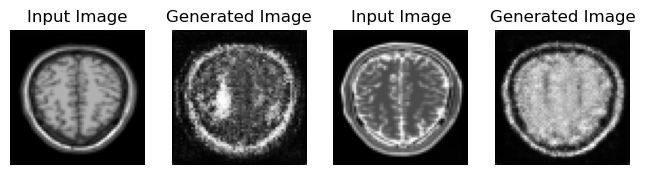

Saving checkpoint for epoch 42 at ./Trained_Model/ckpt-51


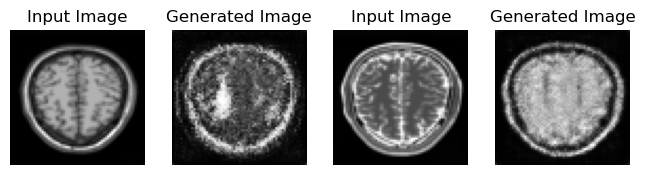

Saving checkpoint for epoch 43 at ./Trained_Model/ckpt-52


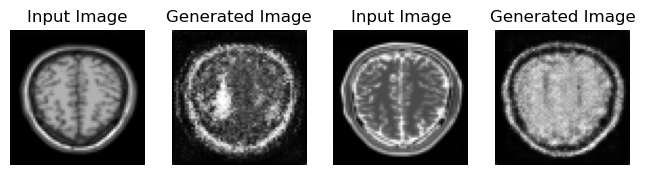

Saving checkpoint for epoch 44 at ./Trained_Model/ckpt-53


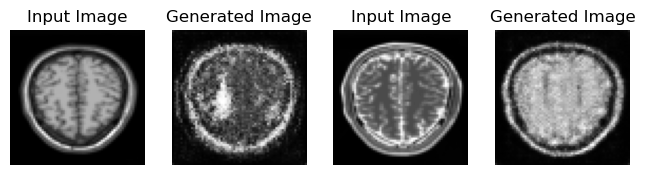

Saving checkpoint for epoch 45 at ./Trained_Model/ckpt-54


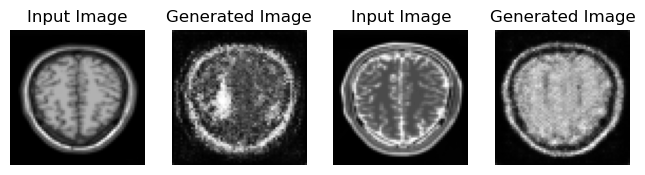

Saving checkpoint for epoch 46 at ./Trained_Model/ckpt-55


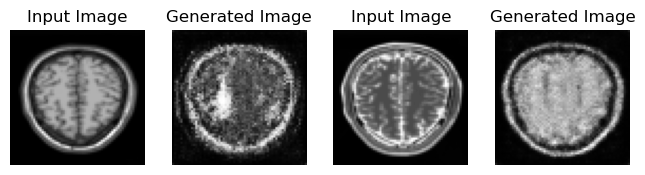

Saving checkpoint for epoch 47 at ./Trained_Model/ckpt-56


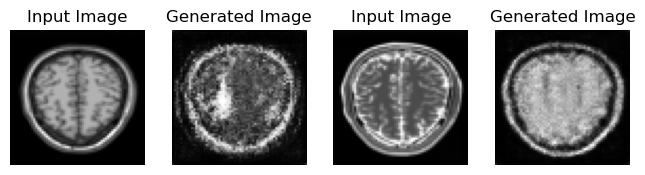

Saving checkpoint for epoch 48 at ./Trained_Model/ckpt-57


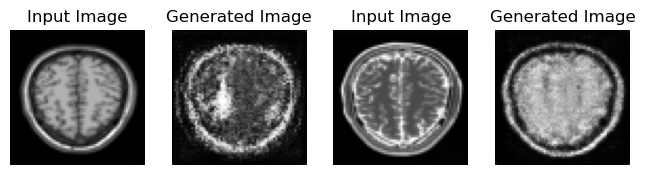

Saving checkpoint for epoch 49 at ./Trained_Model/ckpt-58


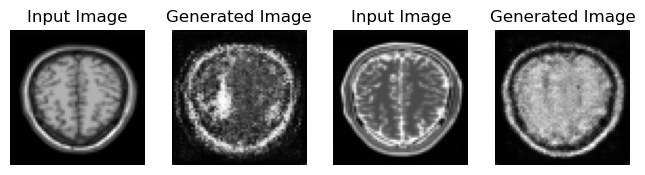

Saving checkpoint for epoch 50 at ./Trained_Model/ckpt-59


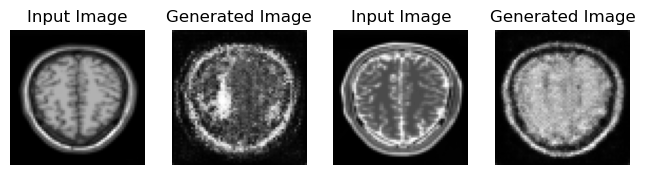

Saving checkpoint for epoch 51 at ./Trained_Model/ckpt-60


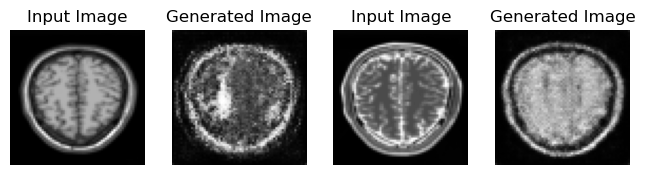

Saving checkpoint for epoch 52 at ./Trained_Model/ckpt-61


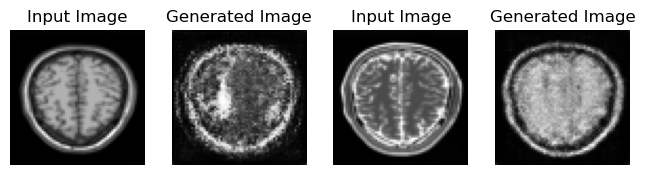

Saving checkpoint for epoch 53 at ./Trained_Model/ckpt-62


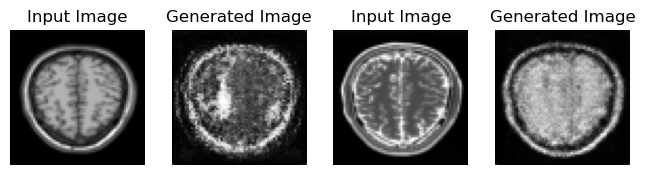

Saving checkpoint for epoch 54 at ./Trained_Model/ckpt-63


2025-04-30 21:06:52.198227: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


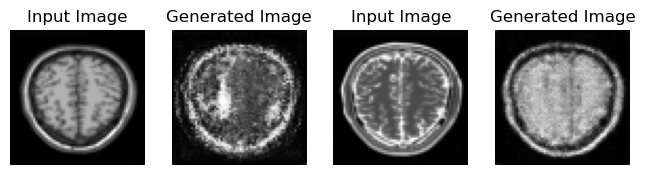

Saving checkpoint for epoch 55 at ./Trained_Model/ckpt-64


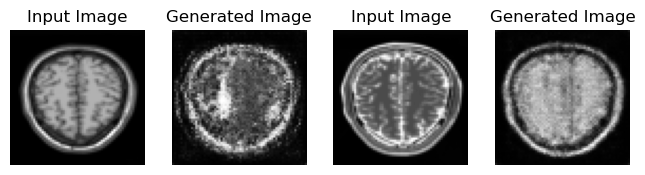

Saving checkpoint for epoch 56 at ./Trained_Model/ckpt-65


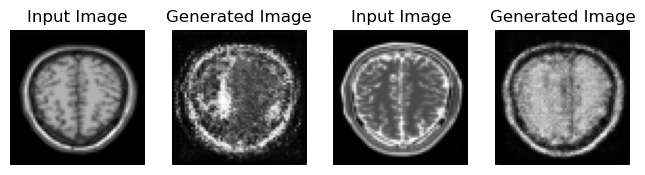

Saving checkpoint for epoch 57 at ./Trained_Model/ckpt-66


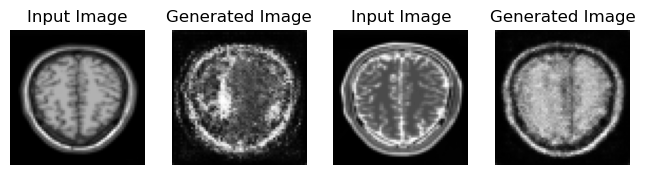

Saving checkpoint for epoch 58 at ./Trained_Model/ckpt-67


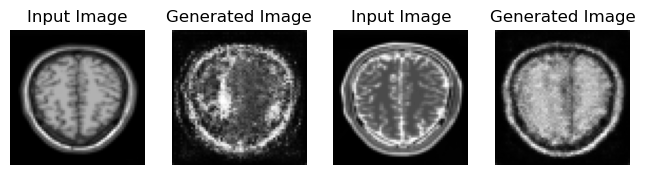

Saving checkpoint for epoch 59 at ./Trained_Model/ckpt-68


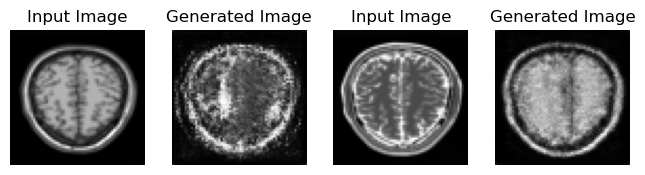

Saving checkpoint for epoch 60 at ./Trained_Model/ckpt-69


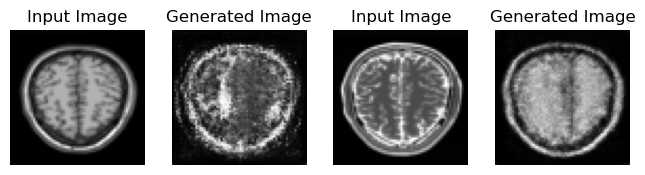

Saving checkpoint for epoch 61 at ./Trained_Model/ckpt-70


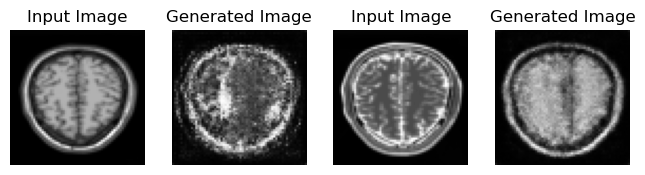

Saving checkpoint for epoch 62 at ./Trained_Model/ckpt-71


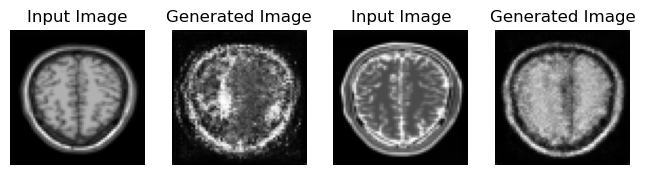

Saving checkpoint for epoch 63 at ./Trained_Model/ckpt-72


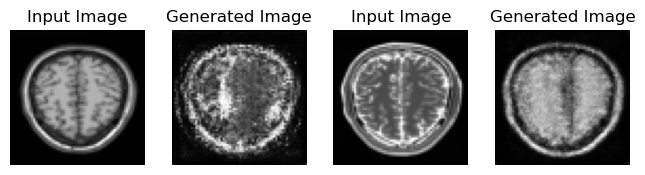

Saving checkpoint for epoch 64 at ./Trained_Model/ckpt-73


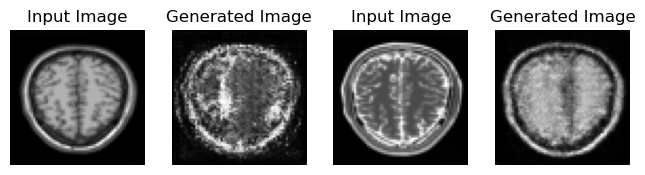

Saving checkpoint for epoch 65 at ./Trained_Model/ckpt-74


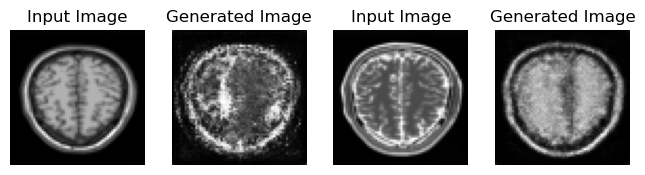

Saving checkpoint for epoch 66 at ./Trained_Model/ckpt-75


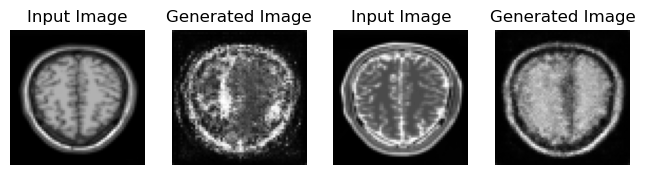

Saving checkpoint for epoch 67 at ./Trained_Model/ckpt-76


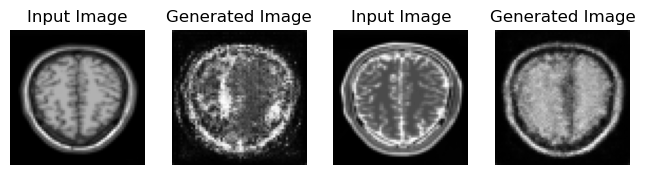

Saving checkpoint for epoch 68 at ./Trained_Model/ckpt-77


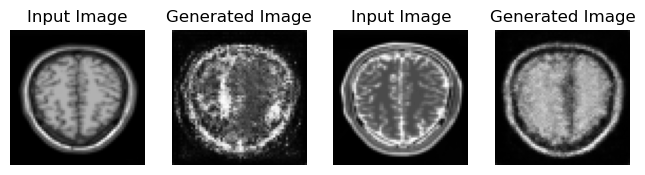

Saving checkpoint for epoch 69 at ./Trained_Model/ckpt-78


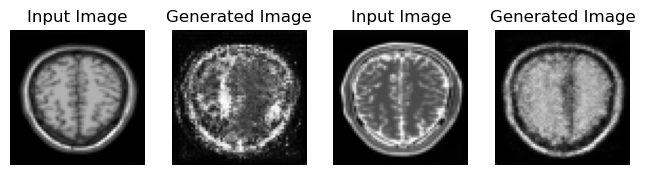

Saving checkpoint for epoch 70 at ./Trained_Model/ckpt-79


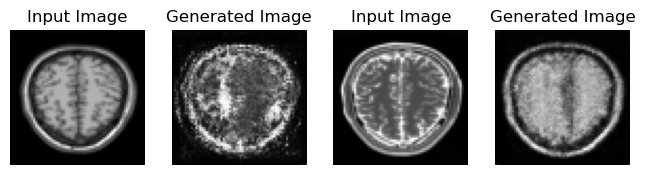

Saving checkpoint for epoch 71 at ./Trained_Model/ckpt-80


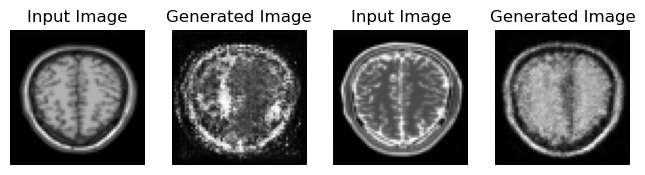

Saving checkpoint for epoch 72 at ./Trained_Model/ckpt-81


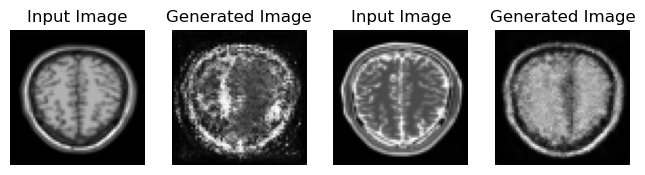

Saving checkpoint for epoch 73 at ./Trained_Model/ckpt-82


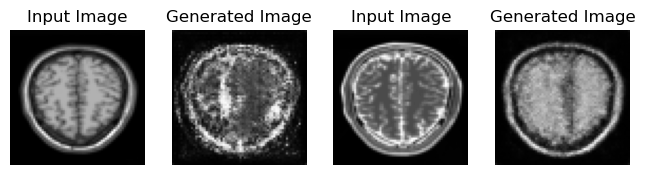

Saving checkpoint for epoch 74 at ./Trained_Model/ckpt-83


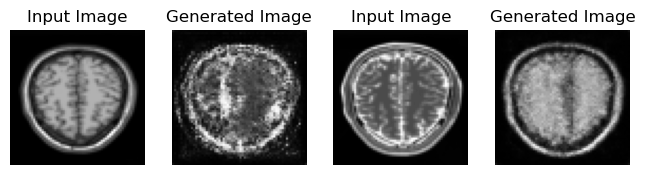

Saving checkpoint for epoch 75 at ./Trained_Model/ckpt-84


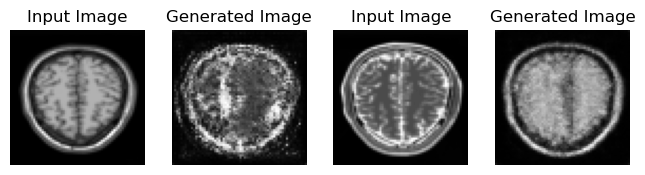

Saving checkpoint for epoch 76 at ./Trained_Model/ckpt-85


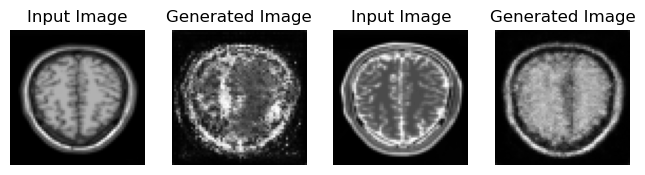

Saving checkpoint for epoch 77 at ./Trained_Model/ckpt-86


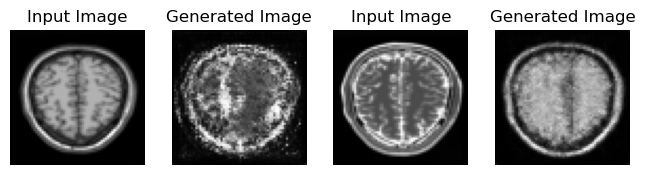

Saving checkpoint for epoch 78 at ./Trained_Model/ckpt-87


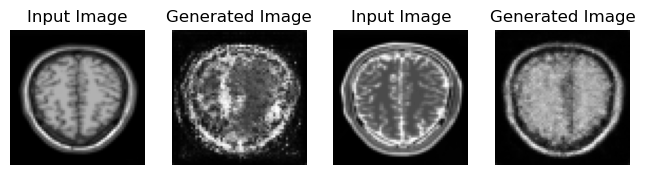

Saving checkpoint for epoch 79 at ./Trained_Model/ckpt-88


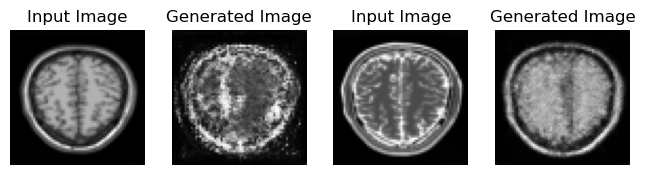

Saving checkpoint for epoch 80 at ./Trained_Model/ckpt-89


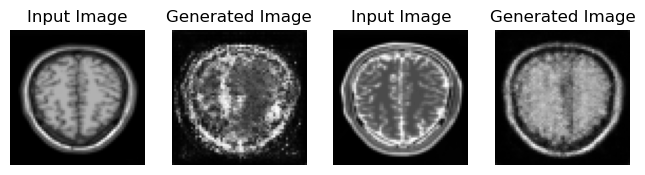

Saving checkpoint for epoch 81 at ./Trained_Model/ckpt-90


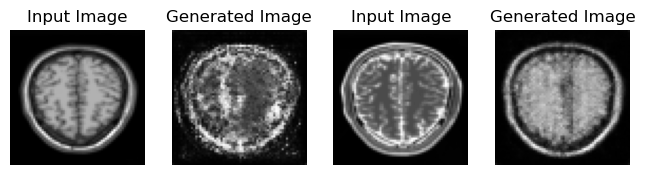

Saving checkpoint for epoch 82 at ./Trained_Model/ckpt-91


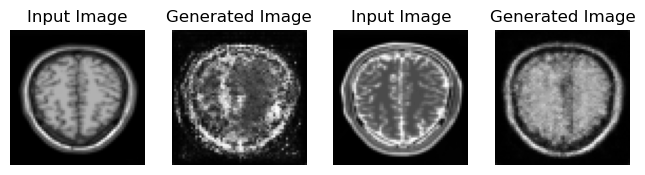

Saving checkpoint for epoch 83 at ./Trained_Model/ckpt-92


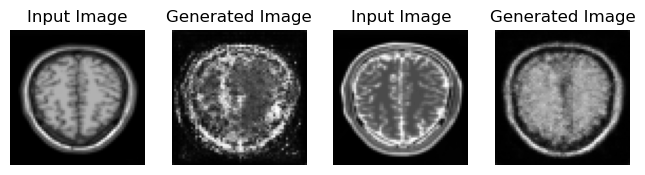

Saving checkpoint for epoch 84 at ./Trained_Model/ckpt-93


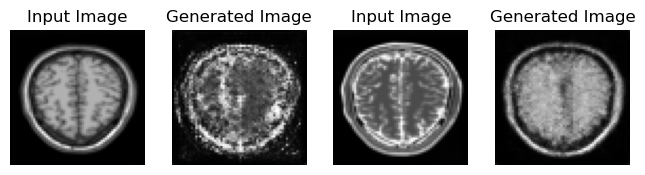

Saving checkpoint for epoch 85 at ./Trained_Model/ckpt-94


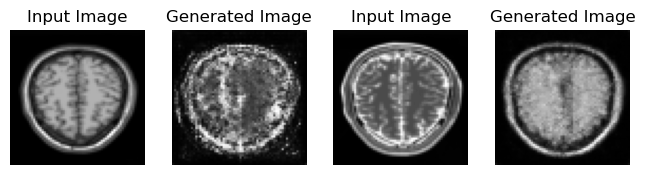

Saving checkpoint for epoch 86 at ./Trained_Model/ckpt-95


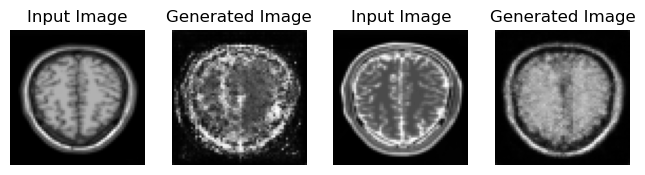

Saving checkpoint for epoch 87 at ./Trained_Model/ckpt-96


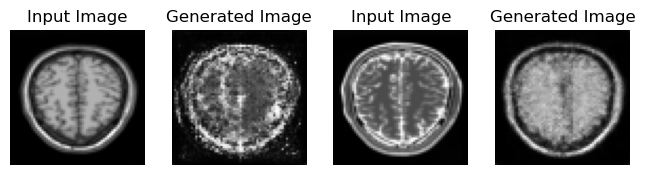

Saving checkpoint for epoch 88 at ./Trained_Model/ckpt-97


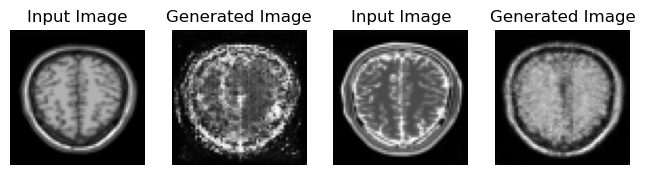

Saving checkpoint for epoch 89 at ./Trained_Model/ckpt-98


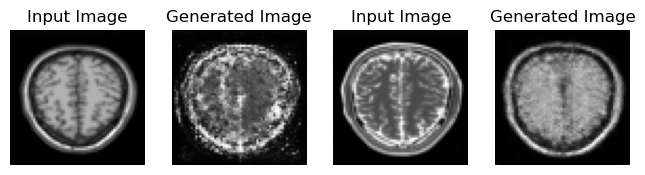

Saving checkpoint for epoch 90 at ./Trained_Model/ckpt-99


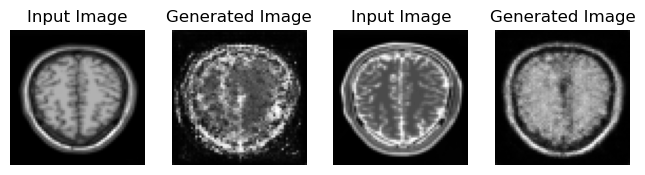

Saving checkpoint for epoch 91 at ./Trained_Model/ckpt-100


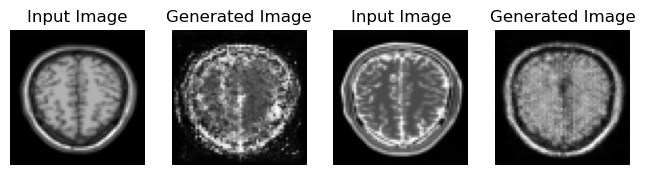

Saving checkpoint for epoch 92 at ./Trained_Model/ckpt-101


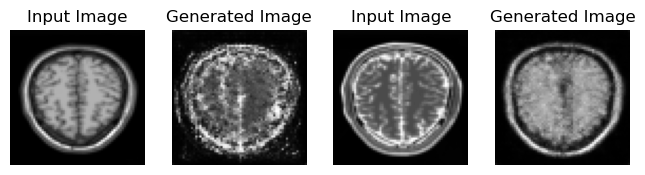

Saving checkpoint for epoch 93 at ./Trained_Model/ckpt-102


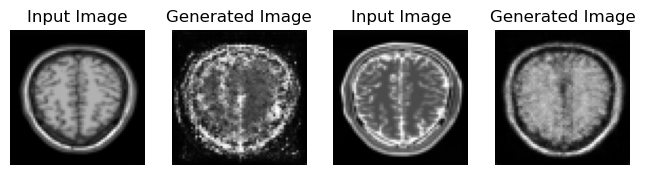

Saving checkpoint for epoch 94 at ./Trained_Model/ckpt-103


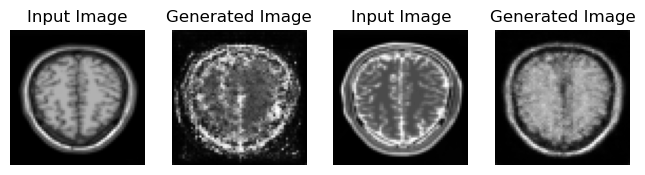

Saving checkpoint for epoch 95 at ./Trained_Model/ckpt-104


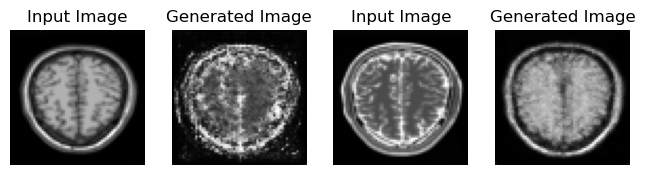

Saving checkpoint for epoch 96 at ./Trained_Model/ckpt-105


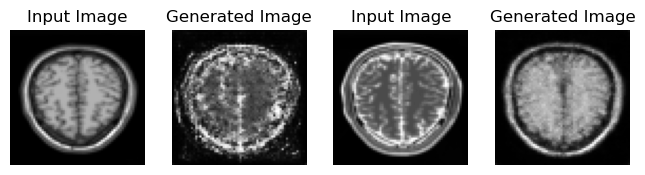

Saving checkpoint for epoch 97 at ./Trained_Model/ckpt-106


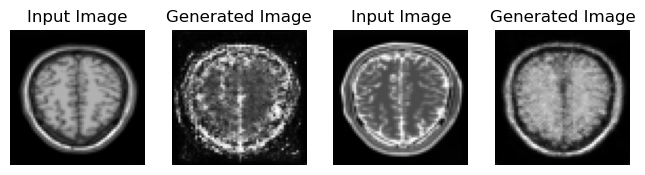

Saving checkpoint for epoch 98 at ./Trained_Model/ckpt-107


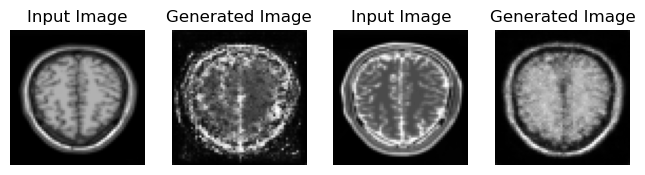

Saving checkpoint for epoch 99 at ./Trained_Model/ckpt-108


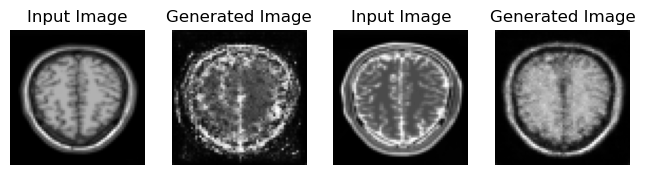

Saving checkpoint for epoch 100 at ./Trained_Model/ckpt-109
CPU times: user 2h 47s, sys: 1min 23s, total: 2h 2min 10s
Wall time: 23min 37s


In [89]:
%%time
for epoch in range(1, EPOCHS+1):
    for image_x, image_y in tf.data.Dataset.zip((t1_resized, t2_resized)):
        train_step(image_x, image_y)
    generate_images(generator_g, t1_sample, generator_f, t2_sample)
    ckpt_save_path = ckpt_manager.save()
    print('Saving checkpoint for epoch', epoch, 'at', ckpt_save_path)

### Generating GIF to VIsualize Results

In [90]:
anim_file = 'cyclegan_mri.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

!pip install git+https://github.com/tensorflow/docs

/tmp/ipykernel_198313/3046465300.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
/tmp/ipykernel_198313/3046465300.py:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-a2kfm5rd
  Running command git clone --filter=blob:none --quiet https://github.com/tensorflow/docs /tmp/pip-req-build-a2kfm5rd
  Resolved https://github.com/tensorflow/docs to commit a8576cef38b7182e6228d7aafca8ef51754ab9e8
  Preparing metadata (setup.py) ... done
  Created wheel for tensorflow-docs: filename=tensorflow_docs-2025.3.6.10029-py3-none-any.whl size=186351 sha256=c3d1cfc1cfa28f7f7a1fc6b04d0ae25a90a659a1e77105136ac0402a6c048f5e
  Stored in directory: /tmp/pip-ephem-wheel-cache-lpl7nk96/wheels/3e/88/34/48d2789bc9d37b33ddce06bccc454fae0285e5396d0a5be9d9
Successfully built tensorflow-docs

[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: pip install --upgrade pip



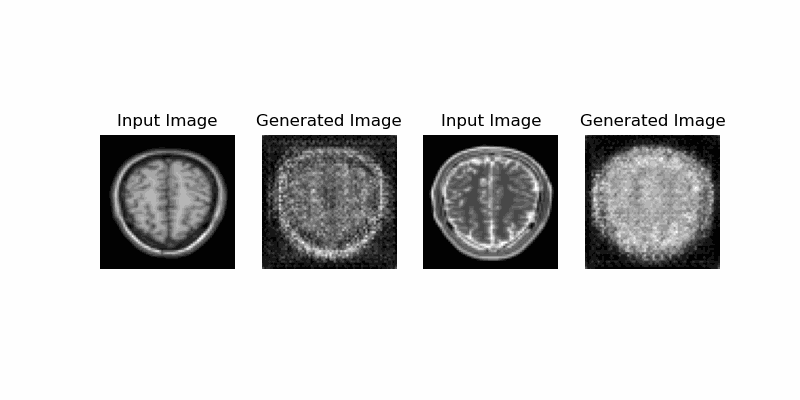

In [91]:
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)